# Using Matplotlib

In [37]:
# required imports
#https://medium.com/analytics-vidhya/generate-a-static-choropleth-india-map-using-corona-virus-pandemic-data-19e9cbf5a07d

import pandas as pd
import seaborn as sns
import geopandas as gpd
import matplotlib.pyplot as plt
import geopandas as gdp  # conda
import geoplot as gplt # pip
import geoplot.crs as gcrs


sns.set_style('whitegrid')

In [38]:
#Reading the shape file
fp = r'india-polygon.shp'
map_df = gpd.read_file(fp)

map_df.head()

,id,st_nm,geometry
0,None,Andaman and Nicobar Islands,"MULTIPOLYGON (((93.84831 7.24028, 93.92705 7.0..."
1,None,Arunachal Pradesh,"POLYGON ((95.23643 26.68105, 95.19594 27.03612..."
2,None,Assam,"POLYGON ((95.19594 27.03612, 95.08795 26.94578..."
3,None,Bihar,"POLYGON ((88.11357 26.54028, 88.28006 26.37640..."
4,None,Chandigarh,"POLYGON ((76.84208 30.76124, 76.83758 30.72552..."


In [39]:
#Reading the excel
data_df = pd.read_excel(r'data_ecxel.xlsx')

data_df.head()

,S. No.,Name of State / UT,Total Confirmed cases,Cured/Discharged/,Death
0,1,Andaman and Nicobar Islands,12,11,0
1,2,Andhra Pradesh,603,42,15
2,3,Arunachal Pradesh,1,0,0
3,4,Assam,35,9,1
4,5,Bihar,85,37,2


In [40]:
#Merging the data
merged = map_df.set_index('st_nm').join(data_df.set_index('Name of State / UT'))
merged.head()

,id,geometry,S. No.,Total Confirmed cases,Cured/Discharged/,Death
st_nm,,,,,,
Andaman and Nicobar Islands,None,"MULTIPOLYGON (((93.84831 7.24028, 93.92705 7.0...",1.0,12.0,11.0,0.0
Arunachal Pradesh,None,"POLYGON ((95.23643 26.68105, 95.19594 27.03612...",3.0,1.0,0.0,0.0
Assam,None,"POLYGON ((95.19594 27.03612, 95.08795 26.94578...",4.0,35.0,9.0,1.0
Bihar,None,"POLYGON ((88.11357 26.54028, 88.28006 26.37640...",5.0,85.0,37.0,2.0
Chandigarh,None,"POLYGON ((76.84208 30.76124, 76.83758 30.72552...",6.0,21.0,9.0,0.0


/home/rohit/anaconda3/lib/python3.7/site-packages/matplotlib/colors.py:527: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


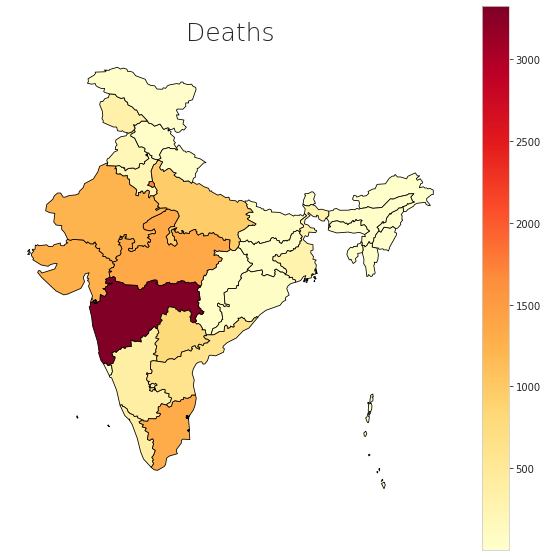

In [41]:
# create figure and axes for Matplotlib and set the title
fig, ax = plt.subplots(1, figsize=(10, 10))
ax.axis('off')
ax.set_title('Deaths', fontdict={'fontsize': '25', 'fontweight' : '10'})

# plot the figure
merged.plot(column='Total Confirmed cases',cmap='YlOrRd', linewidth=0.8, ax=ax, edgecolor='0', legend=True,markersize=[39.739192, -104.990337])

# Using GeoPlot

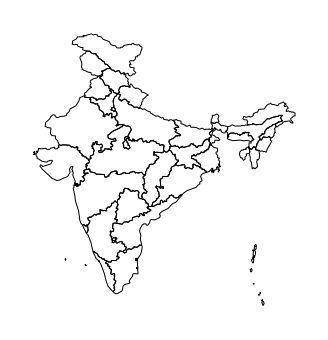

In [42]:
gplt.polyplot(merged)

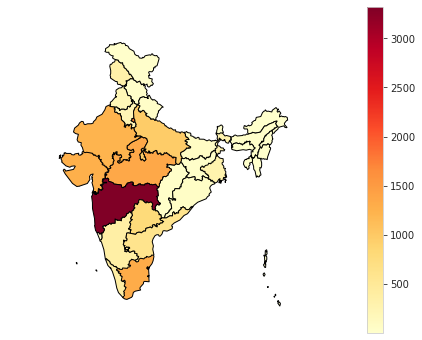

In [43]:
gplt.choropleth(
    merged, hue='Total Confirmed cases', projection=gcrs.AlbersEqualArea(),
    edgecolor='black', linewidth=1,
    cmap='YlOrRd', legend=True
)

# Using Folium

In [50]:
import folium as flm
from folium import plugins
import ipywidgets
import geocoder
import geopy
import numpy as np
import pandas as pd

In [56]:
import json

# load geo_json
# shapefiles can be converted to geojson with QGIS
with open(r'Indian_States') as f:
    geojson_counties = json.load(f)

In [57]:
for i in geojson_counties['features']:
    i['id'] = i['properties']['NAME_1']
    
# load data associated with geo_json
pop_df = pd.read_excel(r'data_ecxel.xlsx')
pop_df.head()

,S. No.,Name of State / UT,Total Confirmed cases,Cured/Discharged/,Death
0,1,Andaman and Nicobar Islands,12,11,0
1,2,Andhra Pradesh,603,42,15
2,3,Arunachal Pradesh,1,0,0
3,4,Assam,35,9,1
4,5,Bihar,85,37,2


In [58]:
map1 = flm.Map(location=[20.5937,78.9629], zoom_start=4)

In [59]:
flm.Choropleth(
    geo_data=geojson_counties,
    name='choropleth',
    data=pop_df,
    columns=['Name of State / UT', 'Total Confirmed cases'],
    # see folium.Choropleth? for details on key_on
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.5,
    line_opacity=0.5).add_to(map1)

# layer control to turn choropleth on or off
flm.LayerControl().add_to(map1)

# display map
map1